In [41]:
import numpy as np

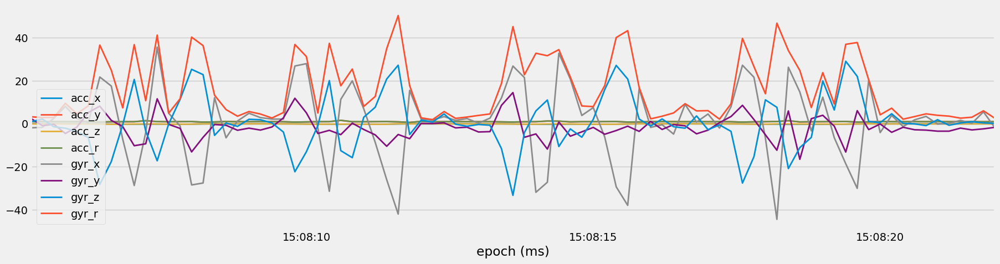

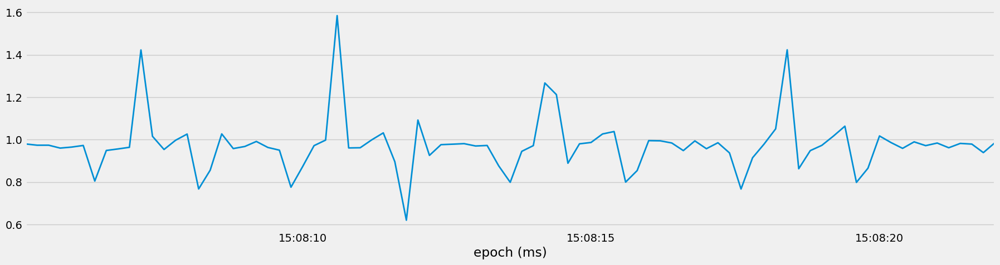

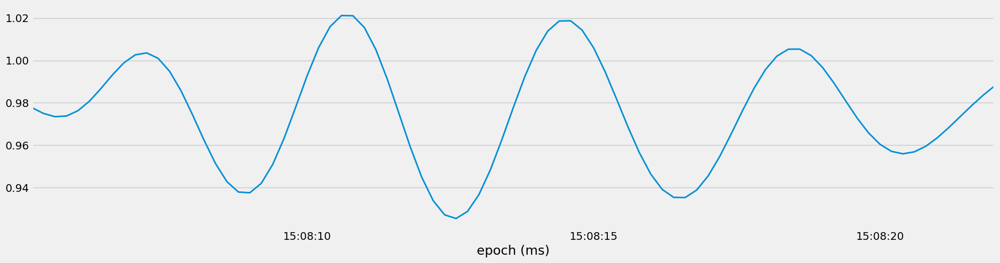

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

pd.options.mode.chained_assignment = None


# Plot settings
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2


# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------

df = pd.read_pickle(r'C:\Users\divya\OneDrive\Desktop\Machine Learning\MachineLearningProjects\Fitness Tracker\data\interim\01_data_processed.pkl')
df = df[df['label'] != 'rest']

acc_r = df['acc_x'] ** 2 + df['acc_y'] ** 2 + df['acc_z'] ** 2
gyr_r = df['gyr_x'] ** 2 + df['gyr_y'] ** 2 + df['gyr_z'] ** 2

df['acc_r'] = np.sqrt(acc_r)
df['gyr_r'] = np.sqrt(gyr_r)





# --------------------------------------------------------------
# Split data
# --------------------------------------------------------------

bench_df = df[df['label'] == 'bench']
squat_df = df[df['label'] == 'squat']
row_df = df[df['label'] == 'row']
ohp_df = df[df['label'] == 'ohp']
dead_df = df[df['label'] == 'dead']

# --------------------------------------------------------------
# Visualize data to identify patterns
# --------------------------------------------------------------

plot_df = bench_df

plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['acc_x'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['acc_y'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['acc_z'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['acc_r'].plot()

plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['gyr_x'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['gyr_y'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['gyr_z'].plot()
plot_df[plot_df['set'] == plot_df['set'].unique()[0]]['gyr_r'].plot()

plt.legend()
plt.show()

# --------------------------------------------------------------
# Configure LowPassFilter
# --------------------------------------------------------------

fs = 1000 / 200 
lowPass = LowPassFilter()

# --------------------------------------------------------------
# Apply and tweak LowPassFilter
# --------------------------------------------------------------

bench_set = bench_df[bench_df['set'] == bench_df['set'].unique()[0]]
row_set = row_df[row_df['set'] == row_df['set'].unique()[0]]
squat_set = squat_df[squat_df['set'] == squat_df['set'].unique()[0]]
ohp_set = ohp_df[ohp_df['set'] == ohp_df['set'].unique()[0]]
dead_set = dead_df[dead_df['set'] == dead_df['set'].unique()[0]]

bench_set['acc_r'].plot()
plt.show()

column = 'acc_r'

lowPass.low_pass_filter(
    bench_set, col = column, sampling_frequency=fs, cutoff_frequency = 0.3, order = 5
)[column + "_lowpass"].plot()
plt.show()


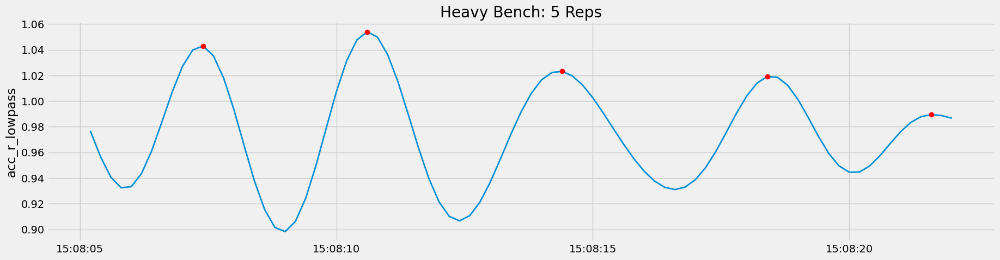

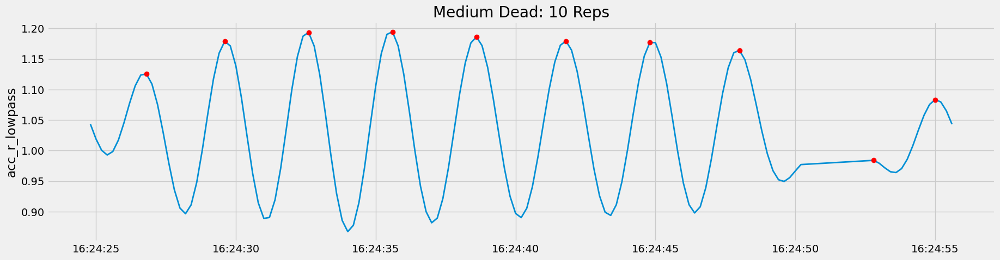

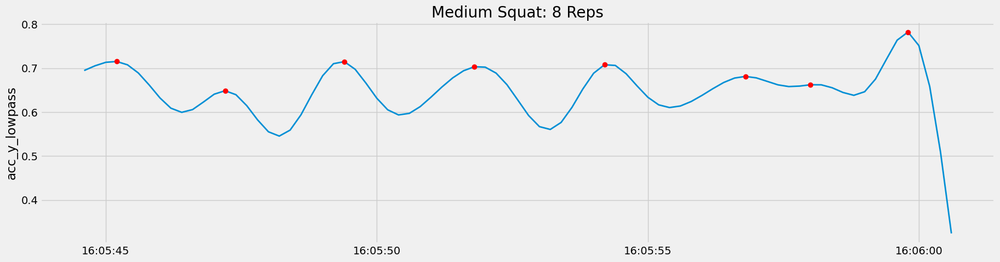

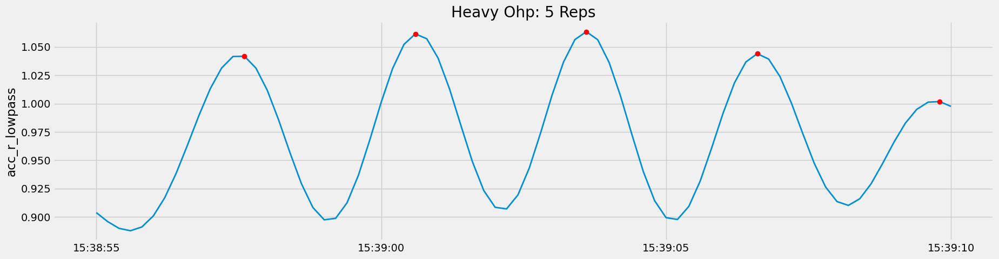

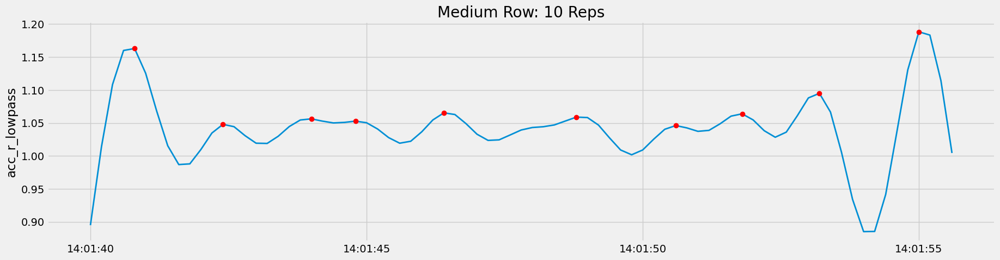

10

In [67]:
# --------------------------------------------------------------
# Create function to count repetitions
# --------------------------------------------------------------

def count_reps(dataset, cutoff = 0.4, order = 10, column = 'acc_r'):
    data = lowPass.low_pass_filter(
        dataset , col = column, sampling_frequency= fs, cutoff_frequency= cutoff, order = order
    )
    indexes = argrelextrema(data[column + '_lowpass'].values, np.greater)
    peaks = data.iloc[indexes]

    fig, ax = plt.subplots()
    plt.plot(dataset[f'{column}_lowpass'])
    plt.plot(peaks[f'{column}_lowpass'], 'o', color = 'red')
    ax.set_ylabel(f'{column}_lowpass')
    exercise = dataset['label'].iloc[0].title()
    category = dataset['category'].iloc[0].title()
    plt.title(f'{category} {exercise}: {len(peaks)} Reps')
    plt.show()

    return len(peaks)


count_reps(bench_set)
count_reps(dead_set)
count_reps(squat_set, cutoff=0.65, column = 'acc_y')
count_reps(ohp_set, cutoff=0.35)
count_reps(row_set, cutoff=0.63)



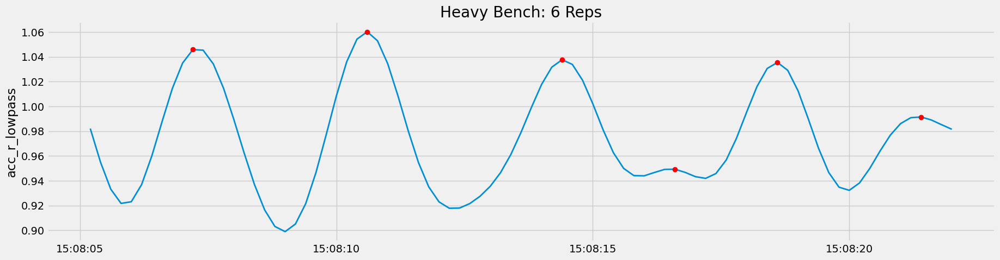

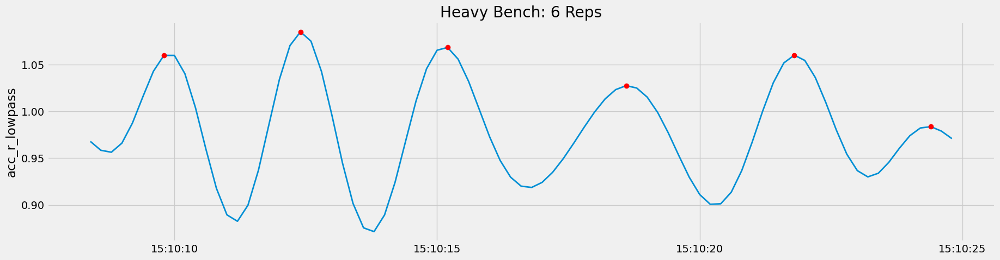

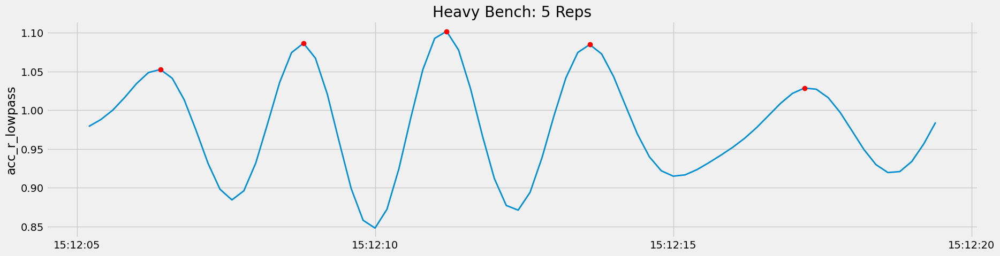

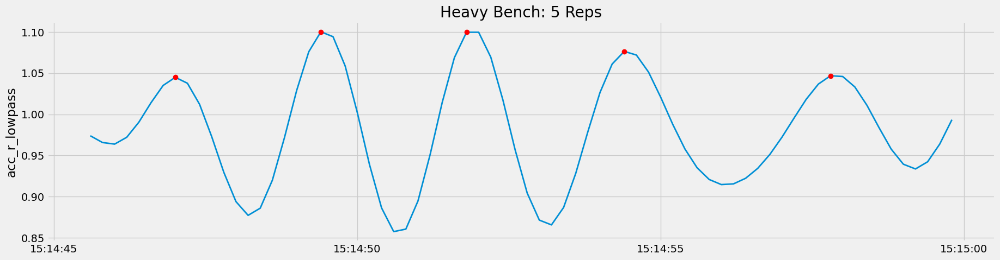

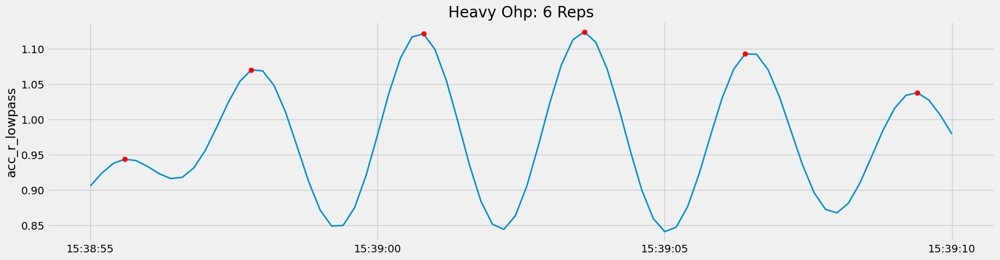

...

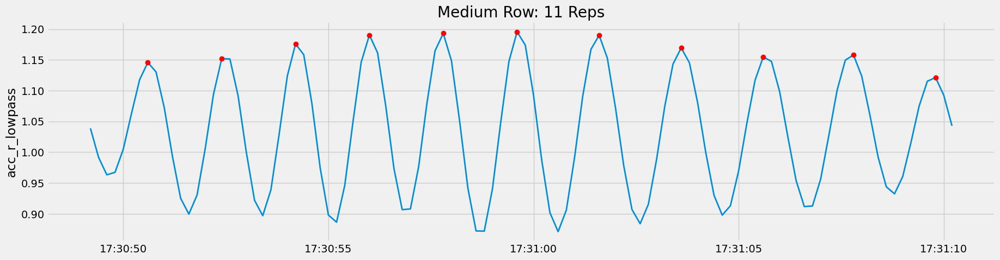

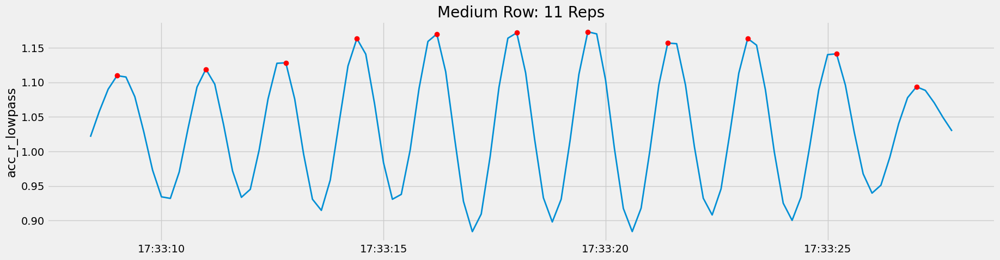

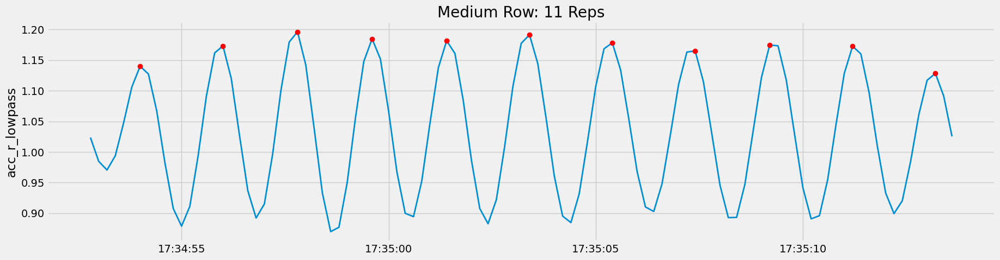

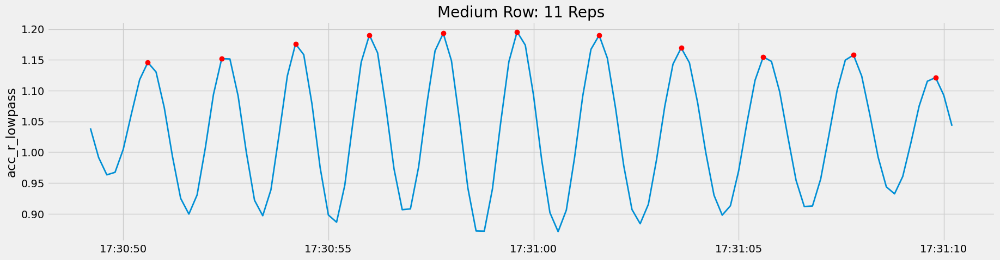

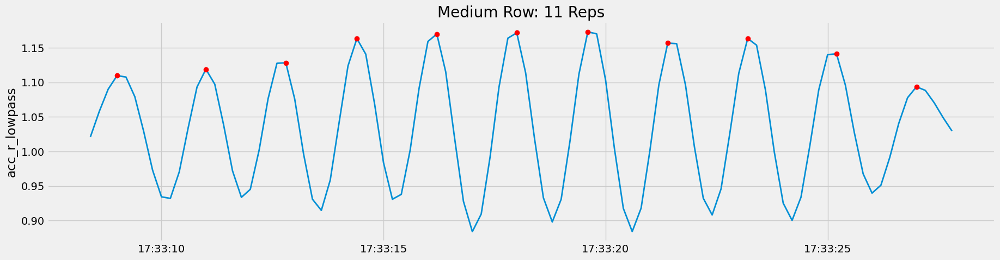

In [114]:
# --------------------------------------------------------------
# Create benchmark dataframe
# --------------------------------------------------------------

df['reps'] = df['category'].apply(lambda x: 5 if x == 'heavy' else 10)

rep_df = df.groupby(['label', 'category', 'set'])['reps'].max().reset_index()

rep_df

rep_df['reps_pred'] = 0

for s in df['set'].unique():
    subset = df[df['set'] == s]

    column = 'acc_r'
    cutoff = 0.35

    if subset['label'].iloc[0] == 'squat':
        cutoff = 0.4

    if subset['label'].iloc[0] == 'bench':
        cutoff = 0.47

    if subset['label'].iloc[0] == 'row':
        cutoff = 0.6

    if subset['label'].iloc[0] == 'ohp':
        cutoff = 0.4

    reps = count_reps(subset, cutoff = cutoff, column = column)
    rep_df.loc[rep_df['set'] == s, 'reps_pred'] = reps

    rep_df


In [115]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,1,5,6
1,bench,heavy,2,5,5
2,bench,heavy,3,5,5
3,bench,heavy,4,5,5
4,bench,heavy,30,5,6
...,...,...,...,...,...
80,squat,medium,28,10,10
81,squat,medium,29,10,10
82,squat,medium,38,10,7
83,squat,medium,63,10,11


In [116]:
error = [(p,e) for (p, e) in zip(rep_df['reps'], rep_df['reps_pred']) if p != e]

In [117]:
error

[(5, 6),
 (5, 6),
 (5, 6),
 (10, 9),
 (10, 11),
 (10, 11),
 (10, 9),
 (10, 11),
 (10, 11),
 (5, 4),
 (5, 4),
 (10, 9),
 (10, 11),
 (10, 9),
 (10, 11),
 (10, 11),
 (10, 9),
 (10, 11),
 (5, 6),
 (5, 4),
 (5, 6),
 (5, 6),
 (5, 4),
 (10, 9),
 (10, 7),
 (10, 8),
 (10, 8),
 (10, 9),
 (10, 5),
 (5, 6),
 (5, 6),
 (10, 8),
 (10, 8),
 (10, 11),
 (10, 11),
 (10, 11),
 (10, 11),
 (10, 11),
 (10, 11),
 (10, 11),
 (10, 11),
 (5, 4),
 (5, 6),
 (10, 6),
 (10, 7),
 (10, 11),
 (10, 9)]

In [118]:
len(error)

47

In [119]:
rep_df.shape

(85, 5)

In [120]:

# --------------------------------------------------------------
# Evaluate the results
# --------------------------------------------------------------

In [121]:
error = mean_absolute_error(rep_df['reps'], rep_df['reps_pred']).round(2)

In [122]:
error

0.73

C:\Users\divya\AppData\Local\Temp\ipykernel_11440\2889190412.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  rep_df.groupby(['label', 'category'])['reps', 'reps_pred'].mean().plot.bar()


<AxesSubplot: xlabel='label,category'>

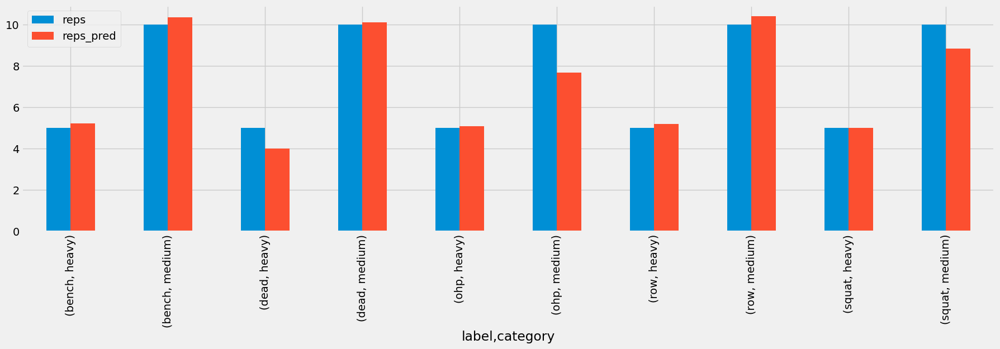

In [123]:
rep_df.groupby(['label', 'category'])['reps', 'reps_pred'].mean().plot.bar()